In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

In [18]:
# Modificar las opciones de visualización de pandas.

# Mostrar todas las filas
#pd.set_option('display.max_rows', None)

# Ajustar el ancho máximo de las columnas (valor en caracteres)
pd.set_option('display.max_colwidth', None)  # O un valor específico como 100

# Mostrar todas las columnas
pd.set_option('display.max_columns', None)

In [19]:
# Cargamos datos
acc_vel_loc_sinrangos = pd.read_csv('../Data_procesada/acc_vel_loc_sinrangos.csv', sep=',')
accesos_por_tecnologia = pd.read_csv('../Data_procesada/accesos_por_tecnologia.csv', sep=',')
accesos_por_velocidad = pd.read_csv('../Data_procesada/accesos_por_velocidad.csv', sep=',')
accesos_tecnologia_localidad = pd.read_csv('../Data_procesada/accesos_tecnologia_localidad.csv', sep=',')
dial_baf = pd.read_csv('../Data_procesada/dial_baf.csv', sep=',')
ingresos = pd.read_csv('../Data_procesada/ingresos.csv', sep=',')
mapa_conectividad = pd.read_csv('../Data_procesada/mapa_conectividad.csv', sep=',')
penetracion_hogares = pd.read_csv('../Data_procesada/penetracion_hogares.csv', sep=',')
penetracion_poblacion = pd.read_csv('../Data_procesada/penetracion_poblacion.csv', sep=',')
penetracion_totales = pd.read_csv('../Data_procesada/penetracion_totales.csv', sep=',')
totales_accesos_por_tecnologia = pd.read_csv('../Data_procesada/totales_accesos_por_tecnologia.csv', sep=',')
totales_accesos_por_velocidad = pd.read_csv('../Data_procesada/totales_accesos_por_velocidad.csv', sep=',')
totales_dial_baf = pd.read_csv('../Data_procesada/totales_dial_baf.csv', sep=',')
totales_vmd = pd.read_csv('../Data_procesada/totales_vmd.csv', sep=',')
velocidad_por_provincia = pd.read_csv('../Data_procesada/velocidad_por_provincia.csv', sep=',')
velocidad_sin_rangos = pd.read_csv('../Data_procesada/velocidad_sin_rangos.csv', sep=',')

### Deteccion de outliers

In [20]:
# DFS
dfs = [acc_vel_loc_sinrangos, accesos_por_tecnologia, accesos_por_velocidad, accesos_tecnologia_localidad, dial_baf, ingresos, mapa_conectividad, penetracion_hogares, penetracion_poblacion, penetracion_totales, totales_accesos_por_tecnologia, totales_accesos_por_velocidad, totales_dial_baf, totales_vmd, velocidad_por_provincia, velocidad_sin_rangos]

In [21]:
accesos_por_tecnologia.head(3)

,año,trimestre,provincia,adsl,cable_modem,fibra_optica,wireless,otros,total
0,2024,1,Buenos Aires,203.297,2.790.663,1.799.013,150.290,101.294,5.044.557
1,2024,1,Capital Federal,70.108,1.177.475,203.756,4.493,48.879,1.504.711
2,2024,1,Catamarca,5.901,11.025,56.542,1.384,81.000,74.933


In [22]:
mapa_conectividad.head(3)

,provincia,partido,localidad,poblacion,adsl,cable_modem,dial_up,fibra_optica,satelital,wireless,telefonia_fija,3g,4g,link,latitud,longitud
0,Buenos Aires,25 de Mayo,25 de Mayo,23408,SI,SI,NO,NO,SI,SI,SI,SI,SI,6854100.0,35.433939,60.173121
1,Buenos Aires,25 de Mayo,Agustín Mosconi,280,NO,NO,NO,NO,NO,NO,SI,NO,NO,6854010.0,35.739217,60.559063
2,Buenos Aires,25 de Mayo,Del Valle,899,SI,NO,NO,NO,SI,NO,NO,SI,NO,6854020.0,35.897345,60.731609


In [23]:

# Combina todos los DataFrames en uno solo
combined_df = pd.concat(dfs, ignore_index=True)

# Detectar outliers en todas las columnas numéricas
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25) # Q1 es el primer cuartil (percentil 25), que es el valor por debajo del cual se encuentra el 25% de los datos.
    Q3 = df[column].quantile(0.75) # Q3 es el tercer cuartil (percentil 75), que es el valor por debajo del cual se encuentra el 75% de los datos.
    IQR = Q3 - Q1 # IQR es la diferencia entre el tercer cuartil y el primer cuartil. Este rango representa el rango central del 50% de los datos.
    lower_bound = Q1 - 1.5 * IQR # lower_bound es el límite inferior, calculado restando 1.5 veces el IQR de Q1.
    upper_bound = Q3 + 1.5 * IQR # upper_bound es el límite superior, calculado sumando 1.5 veces el IQR a Q3.
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)] # Aquí se devuelve un DataFrame que contiene solo las filas donde los valores en la columna especificada son menores que lower_bound o mayores que upper_bound, es decir, los outliers.

# Aplicar a cada DataFrame individualmente
for df in dfs:
    for column in df.select_dtypes(include=['float64', 'int64']).columns:
        outliers = detect_outliers_iqr(df, column)
        print(f"Outliers en {column} de DataFrame:\n{outliers}")


Outliers en otros de DataFrame:
         provincia          partido                 localidad link_indec  \
21    Buenos Aires    Adolfo Alsina                      Maza    6007070   
32    Buenos Aires  Almirante Brown                   Burzaco    6028010   
44    Buenos Aires        Arrecifes                 Arrecifes    6077010   
47    Buenos Aires       Avellaneda                Avellaneda    6035010   
49    Buenos Aires       Avellaneda                  Dock Sud    6035010   
...            ...              ...                       ...        ...   
3042       Tucuman            OTROS                     Otros  Sin Datos   
3043       Tucuman        Río Chico                 Aguilares   90077010   
3059       Tucuman       Tafí Viejo                Tafí Viejo   90105080   
3063       Tucuman      Yerba Buena             Villa Carmela   90119020   
3064       Tucuman      Yerba Buena  Yerba Buena - Marcos Paz   90119030   

      otros  0,256 mbps  0,5 mbps  0,512 mbps  0,75 mbp

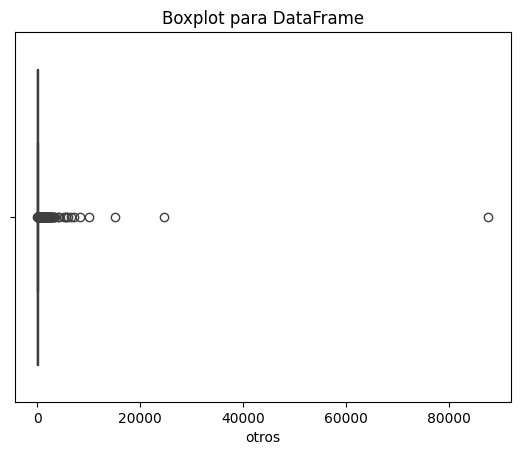

In [24]:
sns.boxplot(data=combined_df, x='otros')
plt.title('Boxplot para DataFrame')
plt.show()


### Graficamos nulos
* Graficamos algunos dataframes para ver los nulos

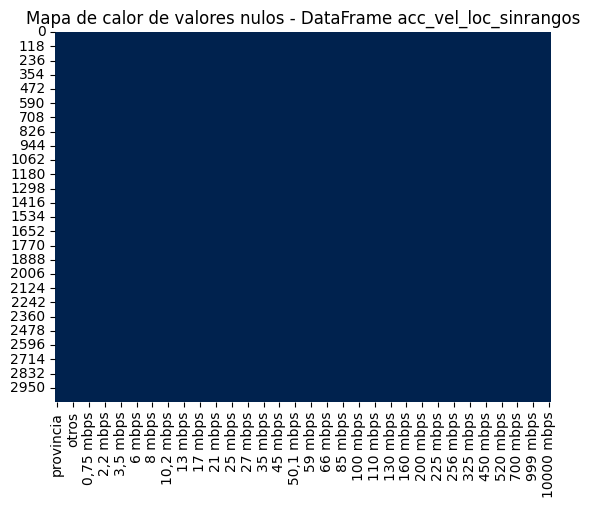

In [25]:
sns.heatmap(acc_vel_loc_sinrangos.isnull(), cbar=False, cmap='cividis')
plt.title('Mapa de calor de valores nulos - DataFrame acc_vel_loc_sinrangos')
plt.show()

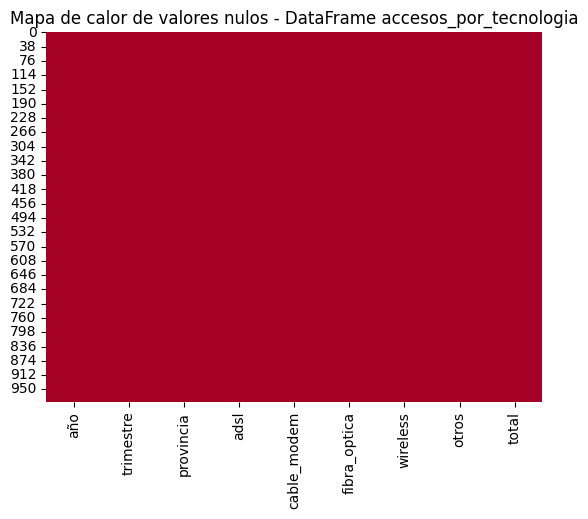

In [26]:
sns.heatmap(accesos_por_tecnologia.isnull(), cbar=False, cmap='RdYlBu')
plt.title('Mapa de calor de valores nulos - DataFrame accesos_por_tecnologia')
plt.show()

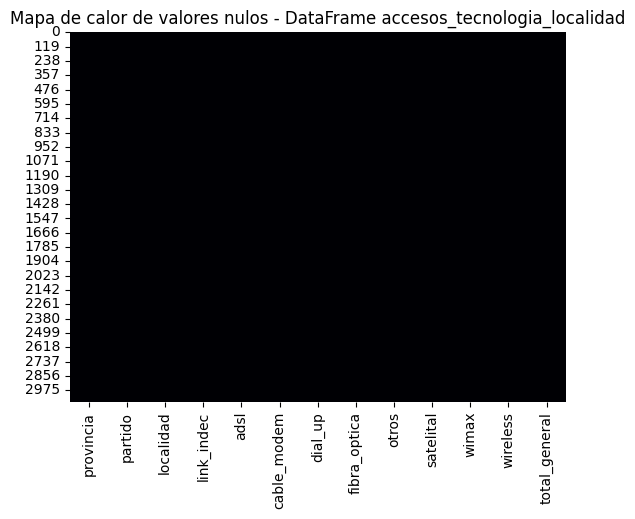

In [27]:
sns.heatmap(accesos_tecnologia_localidad.isnull(), cbar=False, cmap='inferno')
plt.title('Mapa de calor de valores nulos - DataFrame accesos_tecnologia_localidad')
plt.show()

### Duplicados

In [28]:
# Contar número de registros duplicados
num_duplicados = accesos_por_tecnologia.duplicated().sum()
print(f"Número de registros duplicados: {num_duplicados}")

Número de registros duplicados: 0


In [29]:
def ver_duplicados(dfs):
    """
    Esta función recibe una lista de DataFrames y muestra los registros duplicados
    en cada uno de ellos.

    Parámetros:
    dfs (list): Lista de DataFrames a analizar.

    Retorna:
    dict: Un diccionario donde las llaves son los índices de los DataFrames en la lista
    y los valores son los DataFrames que contienen los registros duplicados.
    """
    resultados = {}
    
    for i, df in enumerate(dfs):
        # Mostrar registros duplicados
        duplicados = df[df.duplicated()]
        
        # Contar número de registros duplicados
        num_duplicados = duplicados.shape[0]
        
        # Almacenar los resultados en un diccionario
        if num_duplicados > 0:
            resultados[i] = {
                'num_duplicados': num_duplicados,
                'datos_duplicados': duplicados
            }
        else:
            resultados[i] = {
                'num_duplicados': 0,
                'datos_duplicados': pd.DataFrame()
            }
    
    return resultados

dfs = [acc_vel_loc_sinrangos, accesos_por_tecnologia, accesos_por_velocidad, accesos_tecnologia_localidad, dial_baf, ingresos, mapa_conectividad, penetracion_hogares, penetracion_poblacion, penetracion_totales, totales_accesos_por_tecnologia, totales_accesos_por_velocidad, totales_dial_baf, totales_vmd, velocidad_por_provincia, velocidad_sin_rangos]

resultados_duplicados = ver_duplicados(dfs)

# Imprimir resultados
for index, resultado in resultados_duplicados.items():
    print(f"DataFrame {index}:")
    print(f"Número de registros duplicados: {resultado['num_duplicados']}")
    if not resultado['datos_duplicados'].empty:
        print("Datos duplicados:")
        print(resultado['datos_duplicados'])
    print()

DataFrame 0:
Número de registros duplicados: 0

DataFrame 1:
Número de registros duplicados: 0

DataFrame 2:
Número de registros duplicados: 0

DataFrame 3:
Número de registros duplicados: 0

DataFrame 4:
Número de registros duplicados: 0

DataFrame 5:
Número de registros duplicados: 0

DataFrame 6:
Número de registros duplicados: 0

DataFrame 7:
Número de registros duplicados: 0

DataFrame 8:
Número de registros duplicados: 0

DataFrame 9:
Número de registros duplicados: 0

DataFrame 10:
Número de registros duplicados: 0

DataFrame 11:
Número de registros duplicados: 0

DataFrame 12:
Número de registros duplicados: 0

DataFrame 13:
Número de registros duplicados: 0

DataFrame 14:
Número de registros duplicados: 0

DataFrame 15:
Número de registros duplicados: 0



### Nube de palabras

In [30]:
combined_text = ""

# Recorrer cada DataFrame en la lista
for df in dfs:
    # Combinar todos los textos de las columnas de tipo 'object' (cadenas de texto)
    for column in df.select_dtypes(include=['object']).columns:
        combined_text += " ".join(df[column].astype(str)) + " "

# Ahora 'combined_text' contiene todo el texto combinado de todos los DataFrames

* Realmente no podemos sacar informacion de la nube ya que solo aparece nombres de provincias

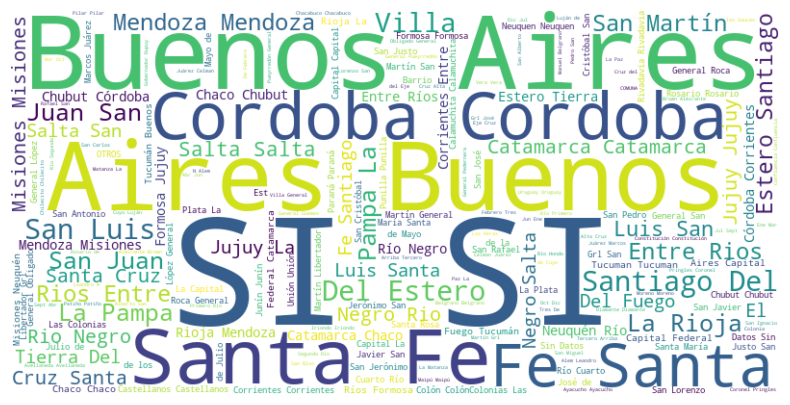

In [31]:
# Crear la nube de palabras
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)

# Mostrar la nube de palabras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # No mostrar los ejes
plt.show()

### Distribución de Velocidades de Conexión por Provincia y Localidad

In [32]:
acc_vel_loc_sinrangos.head(2)

,provincia,partido,localidad,link_indec,otros,"0,256 mbps","0,5 mbps","0,512 mbps","0,75 mbps",1 mbps,"1,5 mbps",2 mbps,"2,2 mbps","2,5 mbps",3 mbps,"3,3 mbps","3,5 mbps",4 mbps,"4,5 mbps",5 mbps,6 mbps,"6,4 mbps",7 mbps,"7,5 mbps",8 mbps,9 mbps,10 mbps,"10,1 mbps","10,2 mbps",11 mbps,12 mbps,"12,3 mbps",13 mbps,14 mbps,15 mbps,16 mbps,17 mbps,18 mbps,20 mbps,"20,5 mbps",21 mbps,22 mbps,23 mbps,24 mbps,25 mbps,"25,1 mbps","25,5 mbps",26 mbps,27 mbps,30 mbps,31 mbps,32 mbps,35 mbps,36 mbps,40 mbps,41 mbps,45 mbps,48 mbps,49 mbps,50 mbps,"50,1 mbps","50,25 mbps",51 mbps,55 mbps,59 mbps,60 mbps,61 mbps,65 mbps,66 mbps,70 mbps,75 mbps,80 mbps,85 mbps,90 mbps,95 mbps,98 mbps,100 mbps,"100,1 mbps","100,25 mbps",105 mbps,110 mbps,120 mbps,122 mbps,125 mbps,130 mbps,140 mbps,150 mbps,155 mbps,160 mbps,164 mbps,165 mbps,180 mbps,200 mbps,205 mbps,212 mbps,220 mbps,225 mbps,240 mbps,246 mbps,250 mbps,256 mbps,275 mbps,300 mbps,320 mbps,325 mbps,330 mbps,350 mbps,400 mbps,450 mbps,480 mbps,500 mbps,512 mbps,520 mbps,540 mbps,600 mbps,680 mbps,700 mbps,800 mbps,850 mbps,900 mbps,999 mbps,1000 mbps,1024 mbps,4000 mbps,10000 mbps
0,Buenos Aires,25 de Mayo,25 de Mayo,6854100,0.0,0.0,2.0,0.0,19.0,0.0,0.0,0.0,0.0,0.0,85.0,0.0,145.0,0.0,0.0,0.0,76.0,0.0,0.0,0.0,299.0,0.0,288.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,415.0,0.0,0.0,0.0,1797.0,0.0,0.0,0.0,0.0,0.0,144.0,0.0,0.0,0.0,0.0,1501.0,0.0,0.0,0.0,0.0,27.0,0.0,0.0,0.0,0.0,647.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,693.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,95.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Buenos Aires,25 de Mayo,Agustín Mosconi,6854010,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,59.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


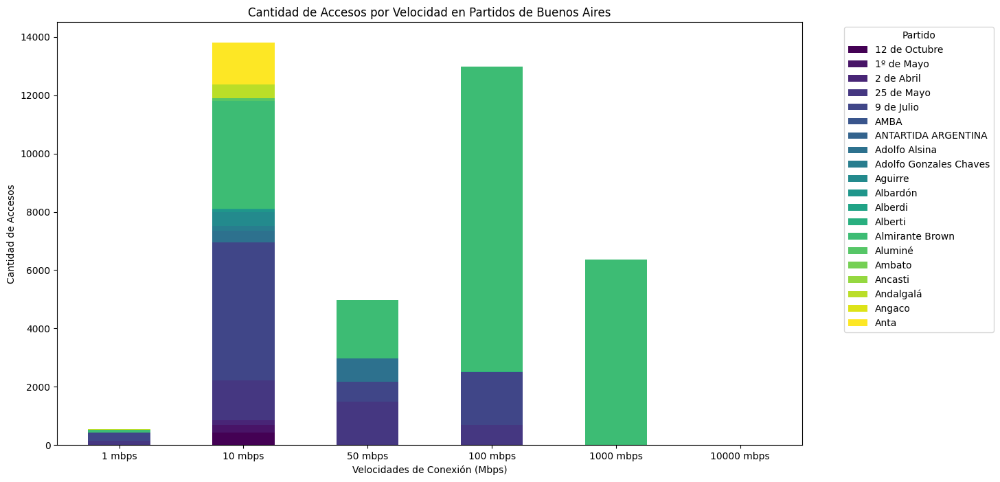

In [33]:
# Asegurando que el DataFrame 'acc_vel_loc_sinrangos' esté en el formato adecuado
df = acc_vel_loc_sinrangos

# Seleccionando solo las columnas que representan velocidades (excluyendo las columnas de ubicación y otras)
vel_columns = df.columns[5:]

# Sumando los valores de accesos para cada velocidad por 'partido'
df_sum = df.groupby('partido')[vel_columns].sum()

# Transponiendo para tener velocidades en el eje X
df_sum_t = df_sum.transpose()

# Filtrando las velocidades que tienen datos
df_sum_t = df_sum_t[df_sum_t.sum(axis=1) > 0]

# Selección de un subconjunto de velocidades clave
velocidades_clave = ['1 mbps', '10 mbps', '50 mbps', '100 mbps', '1000 mbps', '10000 mbps']
df_sum_t_clave = df_sum_t.loc[velocidades_clave]

# Limitando el número de partidos a los primeros 10 (puedes ajustar este valor)
df_sum_t_clave_limited = df_sum_t_clave.iloc[:, :20]

# Generando el gráfico de barras apiladas
plt.figure(figsize=(14, 8))
df_sum_t_clave_limited.plot(kind='bar', stacked=True, colormap='viridis', ax=plt.gca())

# Configurando las etiquetas y título
plt.xlabel("Velocidades de Conexión (Mbps)")
plt.ylabel("Cantidad de Accesos")
plt.title("Cantidad de Accesos por Velocidad en Partidos de Buenos Aires")

# Agregando la leyenda, limitando el número de partidos
plt.legend(title="Partido", bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar el gráfico
plt.xticks(rotation=0)
plt.show()

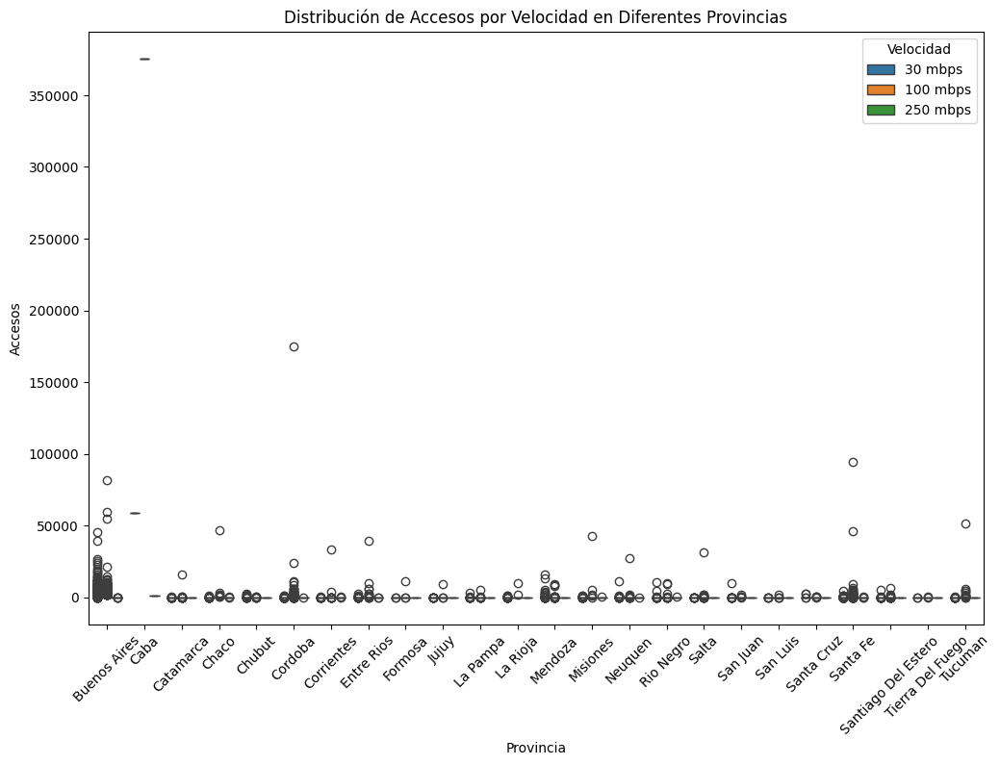

In [34]:
# Crearemos un boxplot para una selección de columnas de velocidad
velocidades = ['30 mbps', '100 mbps', '250 mbps']  # Selecciona las columnas de velocidad que deseas analizar

# Filtrar solo las columnas necesarias junto con la columna de 'provincia'
df_velocidades = acc_vel_loc_sinrangos[['provincia'] + velocidades]

# Convertir el DataFrame a formato largo para hacer el boxplot
df_melted = df_velocidades.melt(id_vars='provincia', var_name='Velocidad', value_name='Accesos')

# Graficar boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(x='provincia', y='Accesos', hue='Velocidad', data=df_melted)
plt.title('Distribución de Accesos por Velocidad en Diferentes Provincias')
plt.xlabel('Provincia')
plt.ylabel('Accesos')
plt.xticks(rotation=45)
plt.show()

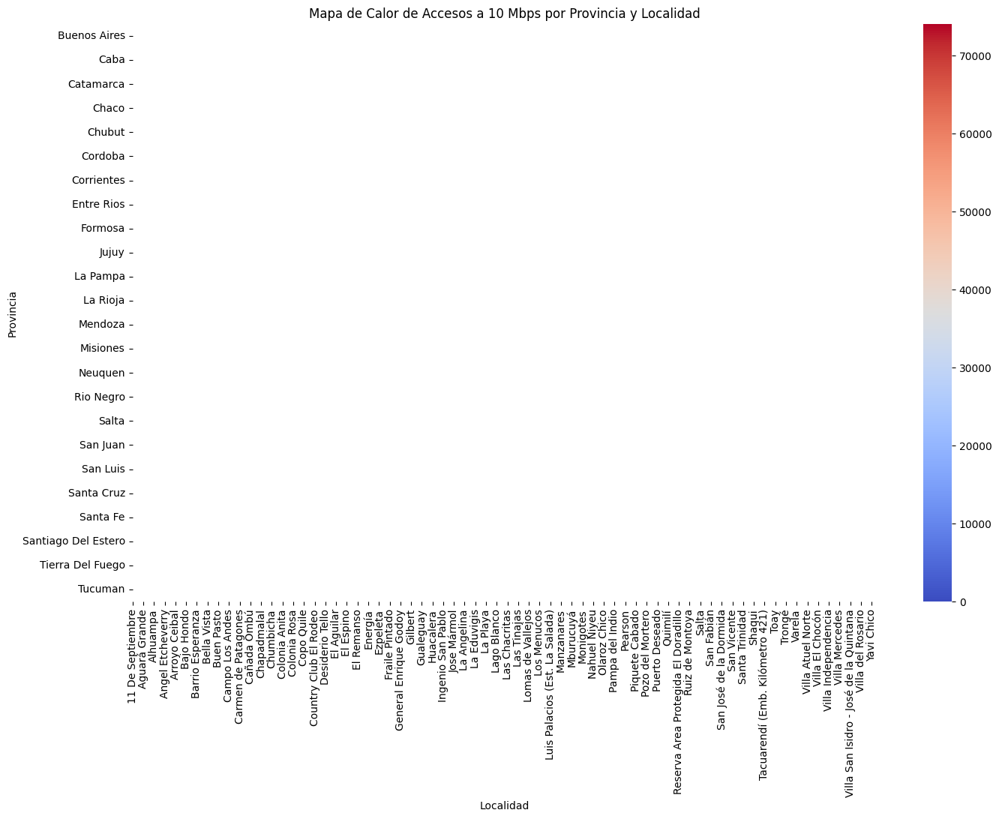

In [35]:
# Crear una tabla pivote para agregar accesos por provincia y localidad
heatmap_data = pd.pivot_table(acc_vel_loc_sinrangos, 
                            values='10 mbps', 
                            index='provincia', 
                            columns='localidad', 
                            aggfunc='sum')

# Graficar el mapa de calor
plt.figure(figsize=(16, 10))
sns.heatmap(heatmap_data, cmap='coolwarm', linewidths=.5)
plt.title('Mapa de Calor de Accesos a 10 Mbps por Provincia y Localidad')
plt.xlabel('Localidad')
plt.ylabel('Provincia')
plt.show()


### Penetración de Acceso por Tecnología en Provincias

In [36]:
velocidad_sin_rangos.head(3)

,año,trimestre,provincia,otros,"0,256 mbps","0,375 mbps","0,625 mbps","0,5 mbps","0,512 mbps","0,75 mbps",1 mbps,"1,2 mbps","1,25 mbps","1,5 mbps",2 mbps,"2,2 mbps","2,5 mbps","6,7 mbps",3 mbps,"3,2 mbps","3,3 mbps","3,5 mbps",4 mbps,"4,5 mbps",5 mbps,6 mbps,"6,4 mbps",7 mbps,"7,5 mbps",8 mbps,9 mbps,10 mbps,"10,1 mbps","10,2 mbps","10,6 mbps",11 mbps,12 mbps,"12,3 mbps",13 mbps,14 mbps,15 mbps,16 mbps,17 mbps,18 mbps,19 mbps,20 mbps,"20,5 mbps",21 mbps,22 mbps,23 mbps,24 mbps,25 mbps,"25,1 mbps","25,11 mbps","25,5 mbps",26 mbps,27 mbps,28 mbps,29 mbps,30 mbps,31 mbps,32 mbps,34 mbps,35 mbps,36 mbps,37 mbps,38 mbps,39 mbps,40 mbps,41 mbps,45 mbps,46 mbps,47 mbps,48 mbps,49 mbps,50 mbps,"50,1 mbps",51 mbps,"50,25 mbps",52 mbps,54 mbps,55 mbps,56 mbps,58 mbps,59 mbps,60 mbps,61 mbps,62 mbps,63 mbps,64 mbps,65 mbps,66 mbps,67 mbps,68 mbps,70 mbps,71 mbps,75 mbps,77 mbps,78 mbps,80 mbps,81 mbps,83 mbps,82 mbps,86 mbps,84 mbps,85 mbps,90 mbps,91 mbps,92 mbps,95 mbps,97 mbps,98 mbps,100 mbps,"100,1 mbps","100,25 mbps",105 mbps,109 mbps,110 mbps,120 mbps,122 mbps,125 mbps,126 mbps,127 mbps,128 mbps,130 mbps,131 mbps,134 mbps,137 mbps,140 mbps,145 mbps,150 mbps,155 mbps,157 mbps,158 mbps,160 mbps,164 mbps,165 mbps,180 mbps,200 mbps,203 mbps,205 mbps,212 mbps,220 mbps,225 mbps,234 mbps,240 mbps,246 mbps,250 mbps,256 mbps,270 mbps,275 mbps,300 mbps,320 mbps,325 mbps,330 mbps,340 mbps,350 mbps,380 mbps,384 mbps,400 mbps,450 mbps,473 mbps,480 mbps,500 mbps,512 mbps,520 mbps,540 mbps,600 mbps,640 mbps,680 mbps,700 mbps,768 mbps,800 mbps,850 mbps,900 mbps,945 mbps,950 mbps,999 mbps,1000 mbps,1024 mbps,1075 mbps,1536 mbps,2000 mbps,2048 mbps,2529 mbps,3072 mbps,4000 mbps,5000 mbps,5125 mbps,6000 mbps,7000 mbps,8000 mbps,10000 mbps
0,2024.0,1.0,Buenos Aires,125.147,18.0,0.0,0.0,25.815,169.0,4.611,17.899,0.0,0.0,141.0,19.52,0.0,21.0,0.0,43.554,0.0,0.0,41.735,13.365,83.0,27.327,75.439,0.0,11.286,53.0,63.826,688.0,157.372,0.0,0.0,0.0,10.0,21.114,0.0,238.0,149.0,94.414,231.0,2.0,1.08,0.0,124.540,0.0,2.0,1.0,20.0,106.0,42.701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,782.651,1.611,16.0,0.0,1.373,30.0,0.0,0.0,0.0,5.574,9.0,0.0,0.0,0.0,659.0,1.0,504.344,0.0,1.0,0.0,0.0,0.0,255.0,0.0,0.0,59.0,75.495,78.0,0.0,0.0,0.0,90.0,0.0,0.0,0.0,7.238,0.0,1.599,0.0,0.0,9.092,0.0,0.0,0.0,0.0,0.0,16.0,3.0,0.0,0.0,0.0,0.0,0.0,865.122,0.0,0.0,14.0,0.0,0.0,496.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,484.778,28.0,0.0,0.0,1.211,0.0,0.0,0.0,7.739,0.0,3.0,1.0,0.0,0.0,0.0,938.0,41.0,258.000,15.0,0.0,0.0,0.000,27.0,0.0,0.0,0.0,0.0,0.0,0.0,965.0,0.0,0.0,5.0,149.68,663.0,0.0,0.0,12.163,0.0,0.0,0.0,0.0,563.0,0.0,0.0,0.0,0.0,26.0,156.691,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2024.0,1.0,Capital Federal,0.000,31.0,0.0,0.0,451.000,34.0,1.307,4.111,0.0,0.0,0.0,249.00,0.0,0.0,0.0,3.971,0.0,0.0,11.975,994.000,0.0,3.547,9.017,0.0,7.000,0.0,16.864,3.0,34.541,0.0,0.0,0.0,5.0,92.000,0.0,0.0,0.0,29.730,5.0,0.0,0.00,0.0,7.537,0.0,1.0,0.0,0.0,0.0,433.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,58.579,0.000,0.0,0.0,24.000,0.0,0.0,0.0,0.0,238.000,0.0,0.0,0.0,0.0,0.0,0.0,66.357,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,17.314,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.000,0.0,1.091,0.0,0.0,11.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,375.600,0.0,0.0,0.0,0.0,1.0,30.0,0.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,147.085,0.0,0.0,0.0,5.000,0.0,0.0,0.0,3.301,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.442,0.0,0.0,1.0,553.467,0.0,2.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,86.44,0.0,0.0,0.0,372.000,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,25.0,68.405,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2024.0,1.0,Catamarca,70.000,0.0,0.0,0.0,34.000,37.0,0.000,176.000,0.0,0.0,0.0,115.00,0.0,0.0,0.0,1.644,0.0,0.0,0.000,1.000,0.0,332.000,780.000,0.0,0.000,0.0,0.000,0.0,3.424,0.0,0.0,0.0,0.0,31.000,0.0,0.0,0.0,1.901,0.0,0.0,0.00,0.0,2.272,0.0,0.0,0.0,0.0,914.0,47.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,861.000,0.000,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,35.211,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0

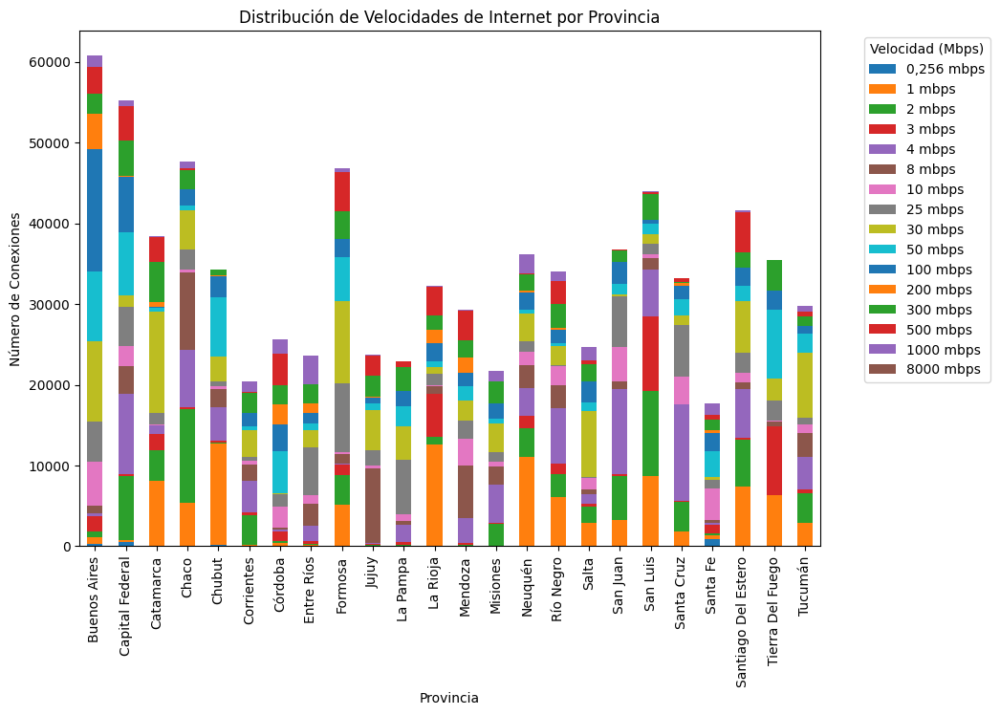

In [37]:
# df_grouped = velocidad_sin_rangos.groupby('provincia').sum()

# Seleccionar las columnas de velocidad que deseas incluir en el gráfico
columnas_seleccionadas = ['0,256 mbps','1 mbps','2 mbps','3 mbps','4 mbps','8 mbps','10 mbps','25 mbps','30 mbps','50 mbps','100 mbps','200 mbps','300 mbps','500 mbps','1000 mbps','8000 mbps']  # Reemplaza con las columnas que desees

# Filtrar el DataFrame con las columnas seleccionadas
df_filtrado = velocidad_sin_rangos[['provincia'] + columnas_seleccionadas]

# Agrupar por provincia y sumar las columnas de velocidades seleccionadas
df_grouped = df_filtrado.groupby('provincia').sum()

# Plotear un gráfico de barras apiladas
df_grouped.plot(kind='bar', stacked=True, figsize=(10, 7))
plt.title('Distribución de Velocidades de Internet por Provincia')
plt.xlabel('Provincia')
plt.ylabel('Número de Conexiones')
plt.legend(title='Velocidad (Mbps)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [38]:
dfs = [acc_vel_loc_sinrangos, accesos_por_tecnologia, accesos_por_velocidad, accesos_tecnologia_localidad, dial_baf, ingresos, mapa_conectividad, penetracion_hogares, penetracion_poblacion, penetracion_totales, totales_accesos_por_tecnologia, totales_accesos_por_velocidad, totales_dial_baf, totales_vmd, velocidad_por_provincia, velocidad_sin_rangos]

In [39]:
accesos_tecnologia_localidad.head(3)

,provincia,partido,localidad,link_indec,adsl,cable_modem,dial_up,fibra_optica,otros,satelital,wimax,wireless,total_general
0,Buenos Aires,25 de Mayo,25 de Mayo,6854100,755.0,4.600,0.0,2.0,0.0,742,0,727.0,6.826
1,Buenos Aires,25 de Mayo,Del Valle,6854020,181.0,0,0.0,0.0,10.0,1,0,0.0,192
2,Buenos Aires,25 de Mayo,Gobernador Ugarte,6854040,0.0,0,0.0,0.0,0.0,0,0,181.0,181


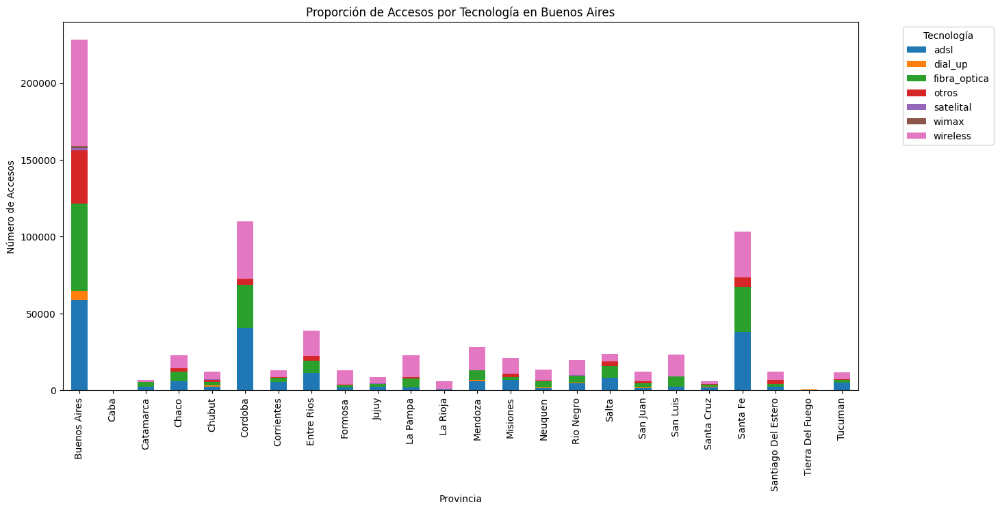

In [40]:
# Agrupar por provincia
df_grouped = accesos_tecnologia_localidad.groupby('provincia').sum()

# Graficar
df_grouped.drop(columns=['link_indec', 'total_general']).plot(kind='bar', stacked=True, figsize=(15, 7))

plt.title('Proporción de Accesos por Tecnología en Buenos Aires')
plt.ylabel('Número de Accesos')
plt.xlabel('Provincia')
plt.xticks(rotation=0)
plt.legend(title='Tecnología', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.show()

### Penetración de Internet en Población y Hogares

In [41]:
penetracion_hogares.head(3)

,año,trimestre,provincia,accesos_por_cada_100_hogares
0,2024.0,1.0,Buenos Aires,"81,10"
1,2024.0,1.0,Capital Federal,"119,53"
2,2024.0,1.0,Catamarca,"68,82"


In [42]:
penetracion_poblacion.head(3)

,año,trimestre,provincia,accesos_por_cada_100_hab
0,2024.0,1.0,Buenos Aires,"27,80"
1,2024.0,1.0,Capital Federal,"48,78"
2,2024.0,1.0,Catamarca,"17,50"


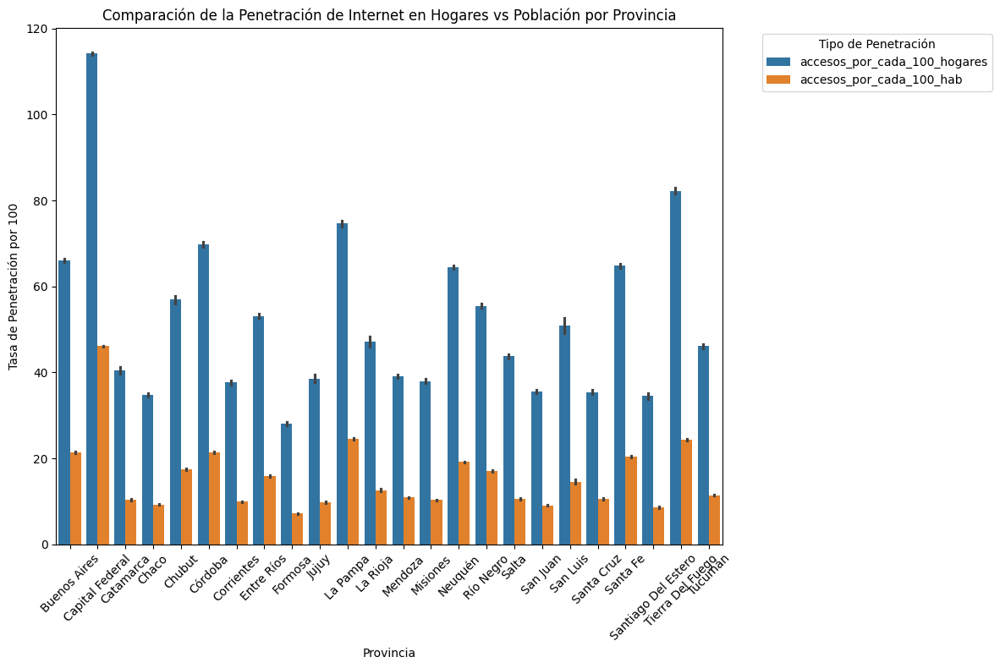

In [43]:
# Reemplazar comas por puntos y convertir a flotantes
penetracion_hogares['accesos_por_cada_100_hogares'] = penetracion_hogares['accesos_por_cada_100_hogares'].astype(str).str.replace(',', '.').astype(float)
penetracion_poblacion['accesos_por_cada_100_hab'] = penetracion_poblacion['accesos_por_cada_100_hab'].astype(str).str.replace(',', '.').astype(float)

# Fusionar los DataFrames
df_combined = pd.merge(penetracion_poblacion, penetracion_hogares, on='provincia', suffixes=('_poblacion', '_hogares'))

# Desapilar los datos para seaborn
df_melted = pd.melt(df_combined, id_vars=['provincia'], value_vars=['accesos_por_cada_100_hogares', 'accesos_por_cada_100_hab'],
                    var_name='Tipo', value_name='Penetracion')

# Crear el gráfico usando seaborn
plt.figure(figsize=(12, 8))
sns.barplot(data=df_melted, x='provincia', y='Penetracion', hue='Tipo')
plt.title('Comparación de la Penetración de Internet en Hogares vs Población por Provincia')
plt.xlabel('Provincia')
plt.ylabel('Tasa de Penetración por 100')
plt.xticks(rotation=45)
plt.legend(title='Tipo de Penetración', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### Comparación de Tecnologías por Localidad

In [44]:
accesos_por_tecnologia.head(3)

,año,trimestre,provincia,adsl,cable_modem,fibra_optica,wireless,otros,total
0,2024,1,Buenos Aires,203.297,2.790.663,1.799.013,150.290,101.294,5.044.557
1,2024,1,Capital Federal,70.108,1.177.475,203.756,4.493,48.879,1.504.711
2,2024,1,Catamarca,5.901,11.025,56.542,1.384,81.000,74.933


In [45]:
accesos_tecnologia_localidad.head(3)

,provincia,partido,localidad,link_indec,adsl,cable_modem,dial_up,fibra_optica,otros,satelital,wimax,wireless,total_general
0,Buenos Aires,25 de Mayo,25 de Mayo,6854100,755.0,4.600,0.0,2.0,0.0,742,0,727.0,6.826
1,Buenos Aires,25 de Mayo,Del Valle,6854020,181.0,0,0.0,0.0,10.0,1,0,0.0,192
2,Buenos Aires,25 de Mayo,Gobernador Ugarte,6854040,0.0,0,0.0,0.0,0.0,0,0,181.0,181


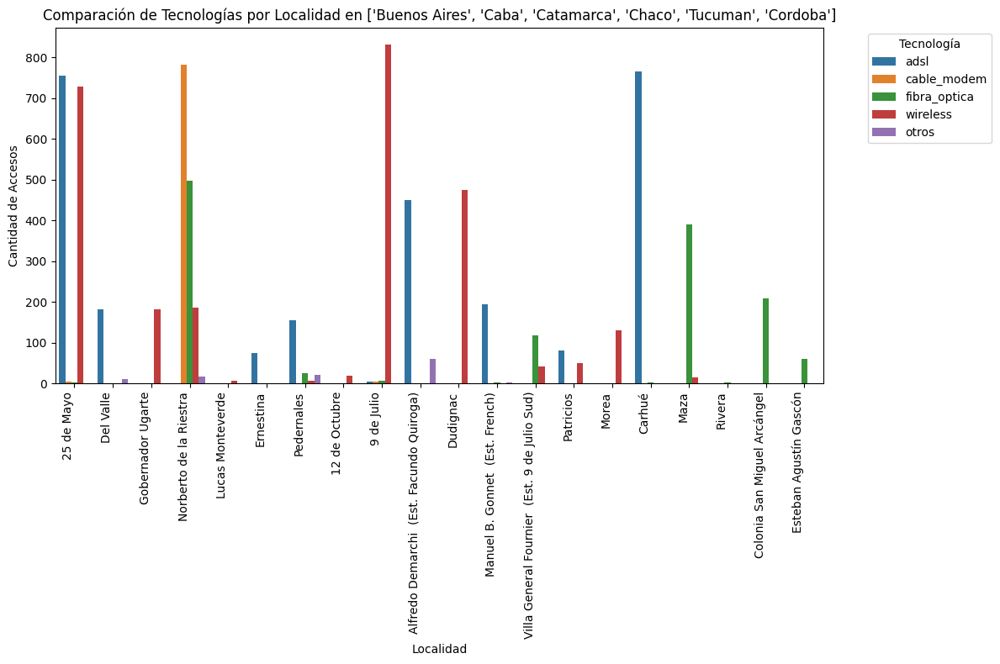

In [46]:
# Convertir las columnas de tecnología a numéricas y corregir valores negativos
columnas_tecnologias = ['adsl', 'cable_modem', 'fibra_optica', 'wireless', 'otros']
accesos_tecnologia_localidad[columnas_tecnologias] = accesos_tecnologia_localidad[columnas_tecnologias].apply(pd.to_numeric, errors='coerce').clip(lower=0)

# Filtrar datos para una provincia específica, por ejemplo, "Buenos Aires"
provincia_filtrada = ['Buenos Aires', 'Caba', 'Catamarca', 'Chaco', 'Tucuman', 'Cordoba']
data_provincia = accesos_tecnologia_localidad[accesos_tecnologia_localidad['provincia'].isin(provincia_filtrada)]

# Seleccionar un subconjunto de localidades para simplificar
data_provincia = data_provincia.head(20)  # Selecciona las primeras 10 localidades

# Transformar datos para gráfico
data_long = data_provincia.melt(id_vars=['provincia', 'localidad'], value_vars=columnas_tecnologias, 
                                var_name='tecnologia', value_name='accesos')

# Crear gráfico de barras
plt.figure(figsize=(12, 8))
sns.barplot(data=data_long, x='localidad', y='accesos', hue='tecnologia')
plt.xticks(rotation=90, ha='right')  # Ajusta la orientación de las etiquetas
plt.title(f'Comparación de Tecnologías por Localidad en {provincia_filtrada}')
plt.xlabel('Localidad')
plt.ylabel('Cantidad de Accesos')
plt.legend(title='Tecnología', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### Proyección de Demanda y Crecimiento

In [47]:
totales_vmd.head(3)

,año,trimestre,mbps(media de bajada),periodo,fecha_inicio,fecha_fin
0,2024,1,"139,15",Ene-Mar 2024,2024-01-01,2024-03-01
1,2023,4,"139,04",Oct-Dic 2023,2023-10-01,2023-12-01
2,2023,3,"129,67",Jul-Sept 2023,2023-07-01,2023-09-01


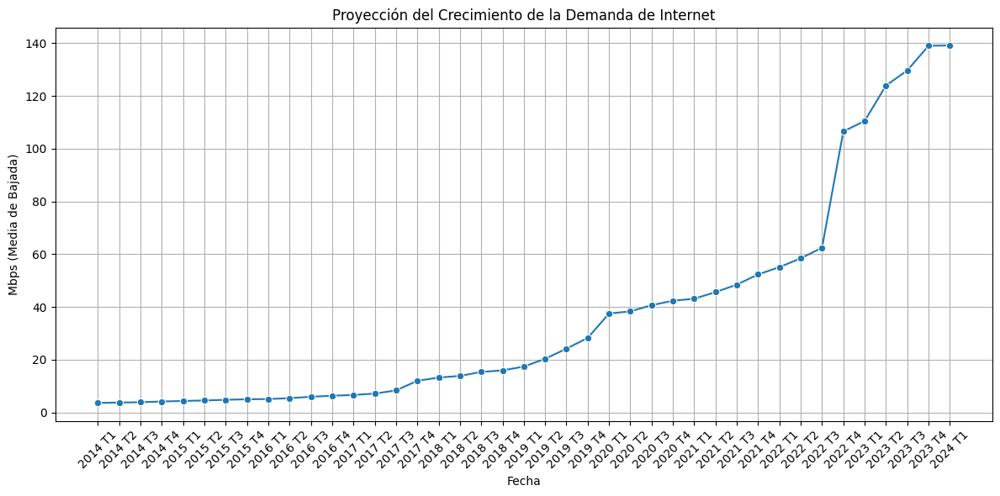

In [48]:
# Crear la nueva columna 'fecha' como texto
totales_vmd['fecha'] = totales_vmd['año'].astype(str) + ' T' + totales_vmd['trimestre'].astype(str)

# Asegurarse de que los datos de Mbps estén en formato string antes de reemplazar comas por puntos
totales_vmd['mbps(media de bajada)'] = totales_vmd['mbps(media de bajada)'].astype(str).str.replace(',', '.').astype(float)

# Ordenar el DataFrame por 'año' y luego por 'trimestre'
totales_vmd = totales_vmd.sort_values(by=['año', 'trimestre'])

# Crear gráfico de líneas
plt.figure(figsize=(12, 6))
sns.lineplot(data=totales_vmd, x='fecha', y='mbps(media de bajada)', marker='o')

plt.title('Proyección del Crecimiento de la Demanda de Internet')
plt.xlabel('Fecha')
plt.ylabel('Mbps (Media de Bajada)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Mostrar gráfico
plt.show()

In [49]:
totales_accesos_por_tecnologia.head(2)

,año,trimestre,adsl,cable_modem,fibra_optica,wireless,otros,total,periodo,fecha_inicio,fecha_fin
0,2024.0,1.0,774.475,5.986.957,4.015.101,598.682,257.941,11.633.156,Ene-Mar 2024,2024-01-01,2024-03-01
1,2023.0,4.0,836.390,6.022.532,3.908.183,585.760,194.796,11.547.661,Oct-Dic 2023,2023-10-01,2023-12-01


In [50]:
accesos_por_velocidad.head(2)

,año,trimestre,provincia,hasta_512_kbps,entre_512_kbps_a_1_mbps,entre_1_mbps_a_6_mbps,entre_6_mbps_a_10_mbps,entre_10_mbps_a_20_mbps,entre_20_mbps_a_30_mbps,mas_de_30_mbps,otros,total
0,2024,1,Buenos Aires,26.002,22.510,221.185,233.225,241.778,106.418,4.068.292,125.147,5.044.557
1,2024,1,Capital Federal,516.000,5.418,29.753,51.415,37.369,5.957,1.374.283,0.000,1.504.711


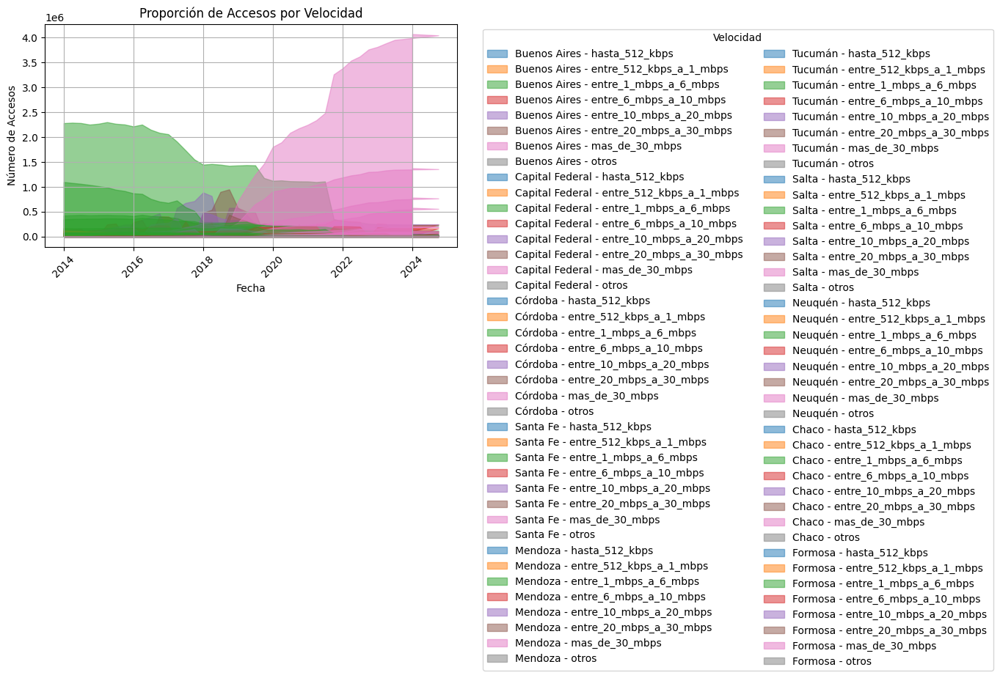

In [51]:
# Función para limpiar columnas numéricas
def clean_numeric_column(df, column_name):
    df[column_name] = df[column_name].astype(str).str.replace('.', '', regex=False).str.replace(',', '.', regex=False)
    df[column_name] = pd.to_numeric(df[column_name], errors='coerce')

# Limpiar columnas numéricas
numeric_columns = [
    'hasta_512_kbps', 'entre_512_kbps_a_1_mbps', 'entre_1_mbps_a_6_mbps',
    'entre_6_mbps_a_10_mbps', 'entre_10_mbps_a_20_mbps', 'entre_20_mbps_a_30_mbps',
    'mas_de_30_mbps', 'otros', 'total'
]

for column in numeric_columns:
    clean_numeric_column(accesos_por_velocidad, column)

# Convertir trimestres a fechas (primer día del mes del trimestre)
def trimestre_a_fecha(año, trimestre):
    trimestre_dict = {1: '01', 2: '04', 3: '07', 4: '10'}
    mes = trimestre_dict.get(trimestre)
    if mes is None:
        raise ValueError(f"Trimestre no reconocido: {trimestre}")
    return pd.to_datetime(f'{año}-{mes}-01')

# Aplicar la conversión a la columna 'Fecha'
accesos_por_velocidad['Fecha'] = accesos_por_velocidad.apply(lambda row: trimestre_a_fecha(row['año'], row['trimestre']), axis=1)

# Reorganizar los datos para el gráfico
data_long = accesos_por_velocidad.melt(
    id_vars=['año', 'trimestre', 'provincia', 'total', 'Fecha'],
    value_vars=numeric_columns[:-1],  # Excluyendo la columna 'total'
    var_name='velocidad',
    value_name='accesos'
)

# Filtrar las provincias a comparar
provincias_a_comparar = [
    'Buenos Aires', 'Capital Federal', 'Córdoba', 'Santa Fe', 'Mendoza',
    'Tucumán', 'Salta', 'Neuquén', 'Chaco', 'Formosa'
]

data_filtered = data_long[data_long['provincia'].isin(provincias_a_comparar)]

# Crear gráfico de áreas
plt.figure(figsize=(14, 7))

# Crear un diccionario para asignar colores a cada velocidad
color_palette = plt.get_cmap('tab10')
colors = {vel: color_palette(i) for i, vel in enumerate(data_filtered['velocidad'].unique())}

# Crear gráfico de áreas usando fill_between
for provincia in provincias_a_comparar:
    df_provincia = data_filtered[data_filtered['provincia'] == provincia]
    for velocidad in df_provincia['velocidad'].unique():
        df_velocidad = df_provincia[df_provincia['velocidad'] == velocidad]
        plt.fill_between(df_velocidad['Fecha'], df_velocidad['accesos'], label=f'{provincia} - {velocidad}', alpha=0.5, color=colors[velocidad])

plt.title('Proporción de Accesos por Velocidad')
plt.xlabel('Fecha')
plt.ylabel('Número de Accesos')
plt.legend(title='Velocidad', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Mostrar gráfico
plt.show()

<h1 align="center">KPI</h1>

In [52]:
penetracion_hogares.head(3)

,año,trimestre,provincia,accesos_por_cada_100_hogares
0,2024.0,1.0,Buenos Aires,81.10
1,2024.0,1.0,Capital Federal,119.53
2,2024.0,1.0,Catamarca,68.82


In [53]:
# Proyectar el próximo trimestre con un incremento del 2%
penetracion_hogares['nuevo_acceso'] = penetracion_hogares['accesos_por_cada_100_hogares'] * 1.02

# Calcular el KPI
penetracion_hogares['kpi'] = ((penetracion_hogares['nuevo_acceso'] - penetracion_hogares['accesos_por_cada_100_hogares']) / penetracion_hogares['accesos_por_cada_100_hogares']) * 100

# Imprimir el DataFrame con el KPI calculado
print(penetracion_hogares[['provincia', 'kpi']])

               provincia  kpi
0           Buenos Aires  2.0
1        Capital Federal  2.0
2              Catamarca  2.0
3                  Chaco  2.0
4                 Chubut  2.0
..                   ...  ...
979           Santa Cruz  2.0
980             Santa Fe  2.0
981  Santiago Del Estero  2.0
982     Tierra Del Fuego  2.0
983              Tucumán  2.0

[984 rows x 2 columns]


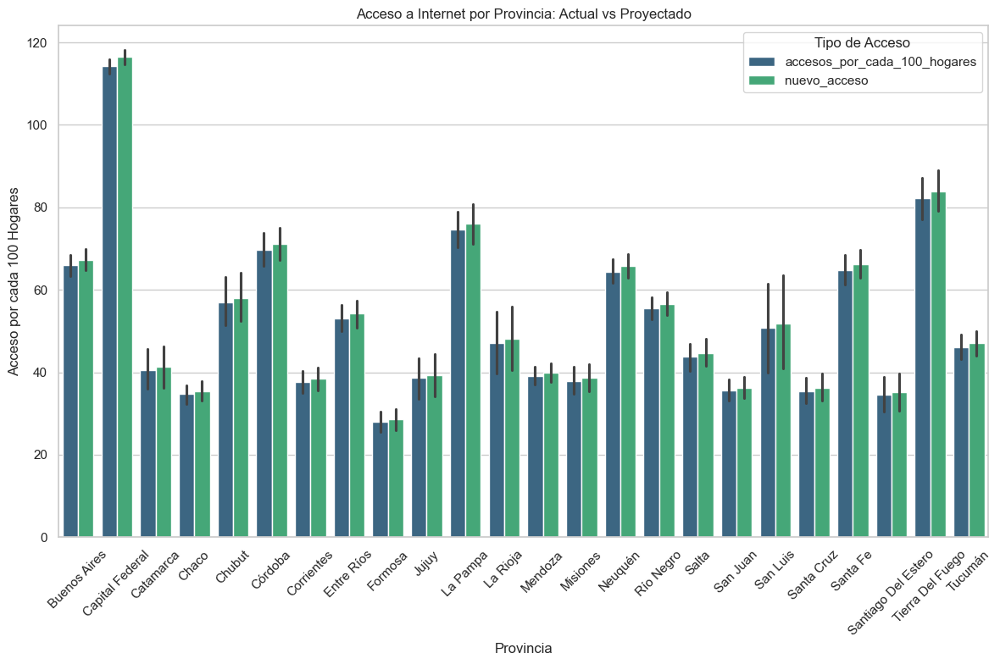

In [54]:
# Calcular el acceso proyectado para el próximo trimestre
penetracion_hogares['nuevo_acceso'] = penetracion_hogares['accesos_por_cada_100_hogares'] * 1.02

# Convertir los datos al formato largo para facilitar la visualización
melted_data = penetracion_hogares.melt(id_vars=['provincia'], 
                                    value_vars=['accesos_por_cada_100_hogares', 'nuevo_acceso'],
                                    var_name='tipo_acceso',
                                    value_name='valor')

# Configuración del estilo del gráfico
sns.set(style="whitegrid")

# Crear el gráfico de barras agrupadas
plt.figure(figsize=(12, 8))
sns.barplot(x='provincia', y='valor', hue='tipo_acceso', data=melted_data, palette='viridis')

# Añadir título y etiquetas
plt.title('Acceso a Internet por Provincia: Actual vs Proyectado')
plt.xlabel('Provincia')
plt.ylabel('Acceso por cada 100 Hogares')
plt.legend(title='Tipo de Acceso')
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.tight_layout()
plt.show()

In [55]:
# Calcular el acceso proyectado para el trimestre 2 de 2024
proyectado_2024_q2 = penetracion_hogares[(penetracion_hogares['año'] == 2024) & (penetracion_hogares['trimestre'] == 1)].copy()
proyectado_2024_q2['trimestre'] = 2
proyectado_2024_q2['accesos_por_cada_100_hogares'] *= 1.02

# Añadir la fila proyectada al DataFrame
penetracion_hogares = pd.concat([penetracion_hogares, proyectado_2024_q2], ignore_index=True)


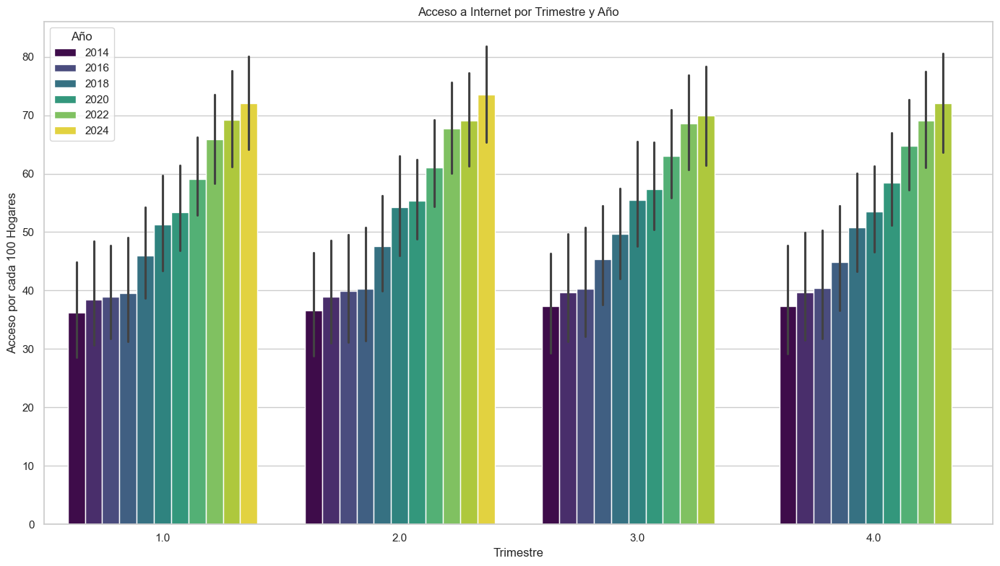

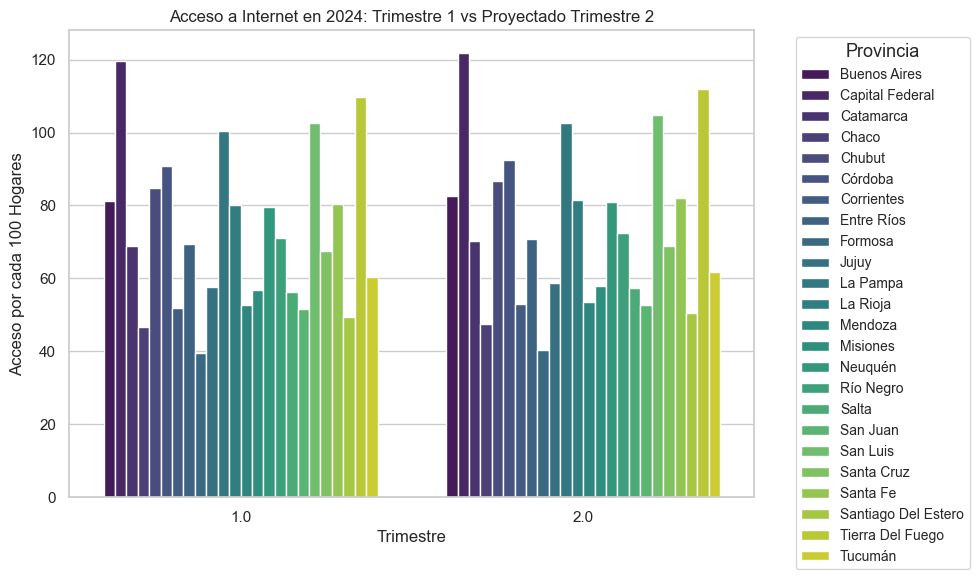

In [56]:
# Configuración del estilo del gráfico
sns.set(style="whitegrid")

# Graficar el acceso a Internet por trimestre y año
plt.figure(figsize=(14, 8))
sns.barplot(x='trimestre', y='accesos_por_cada_100_hogares', hue='año', data=penetracion_hogares, palette='viridis')

# Añadir título y etiquetas
plt.title('Acceso a Internet por Trimestre y Año')
plt.xlabel('Trimestre')
plt.ylabel('Acceso por cada 100 Hogares')
plt.legend(title='Año')

# Mostrar el gráfico
plt.tight_layout()
plt.show()

# Graficar el trimestre 1 y 2 proyectado para 2024
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='trimestre', y='accesos_por_cada_100_hogares', hue='provincia', data=penetracion_hogares[penetracion_hogares['año'] == 2024], palette='viridis')

# Añadir título y etiquetas
plt.title('Acceso a Internet en 2024: Trimestre 1 vs Proyectado Trimestre 2')
plt.xlabel('Trimestre')
plt.ylabel('Acceso por cada 100 Hogares')

# Ajustar la leyenda
plt.legend(title='Provincia', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small', title_fontsize='13')

# Ajustar el diseño del gráfico para que la leyenda no obstruya
plt.tight_layout()

# Mostrar el gráfico
plt.show()

<h1 align="center">KPIs propuestos</h1>

## KPI 1: Tasa de Crecimiento de Accesos por Tecnología

* Descripción:
    Este KPI mide el cambio en la proporción de accesos a Internet por tecnología (por ejemplo, fibra óptica, ADSL, etc.) de un año al siguiente. Permite evaluar la evolución de las diferentes tecnologías a lo largo del tiempo.

    Fórmula:
    KPI
    crecimiento tecnologia =(Acceso año actual, tecnologia − Acceso año anterior, tecnologia / Acceso año anterior, tecnologia) × 100


In [57]:
accesos_por_tecnologia.head()

,año,trimestre,provincia,adsl,cable_modem,fibra_optica,wireless,otros,total
0,2024,1,Buenos Aires,203.297,2.790.663,1.799.013,150.290,101.294,5.044.557
1,2024,1,Capital Federal,70.108,1.177.475,203.756,4.493,48.879,1.504.711
2,2024,1,Catamarca,5.901,11.025,56.542,1.384,81.000,74.933
3,2024,1,Chaco,11.343,58.929,64.463,8.404,12.404,155.543
4,2024,1,Chubut,26.306,77.217,26.356,30.867,9.930,170.676


In [58]:
# Convertir columnas a numérico
accesos_por_tecnologia['adsl'] = pd.to_numeric(accesos_por_tecnologia['adsl'], errors='coerce')
accesos_por_tecnologia['cable_modem'] = pd.to_numeric(accesos_por_tecnologia['cable_modem'], errors='coerce')
accesos_por_tecnologia['fibra_optica'] = pd.to_numeric(accesos_por_tecnologia['fibra_optica'], errors='coerce')
accesos_por_tecnologia['wireless'] = pd.to_numeric(accesos_por_tecnologia['wireless'], errors='coerce')
accesos_por_tecnologia['otros'] = pd.to_numeric(accesos_por_tecnologia['otros'], errors='coerce')
accesos_por_tecnologia['total'] = pd.to_numeric(accesos_por_tecnologia['total'], errors='coerce')

def calcular_crecimiento(df):
    df = df.sort_values(by=['provincia', 'año', 'trimestre'])
    df['adsl_crecimiento'] = df.groupby('provincia')['adsl'].pct_change(fill_method=None) * 100
    df['cable_modem_crecimiento'] = df.groupby('provincia')['cable_modem'].pct_change(fill_method=None) * 100
    df['fibra_optica_crecimiento'] = df.groupby('provincia')['fibra_optica'].pct_change(fill_method=None) * 100
    df['wireless_crecimiento'] = df.groupby('provincia')['wireless'].pct_change(fill_method=None) * 100
    df['otros_crecimiento'] = df.groupby('provincia')['otros'].pct_change(fill_method=None) * 100

    # Opcional: Rellenar valores NaN con 0
    df.fillna(0, inplace=True)
    return df

accesos_crecimiento = calcular_crecimiento(accesos_por_tecnologia)

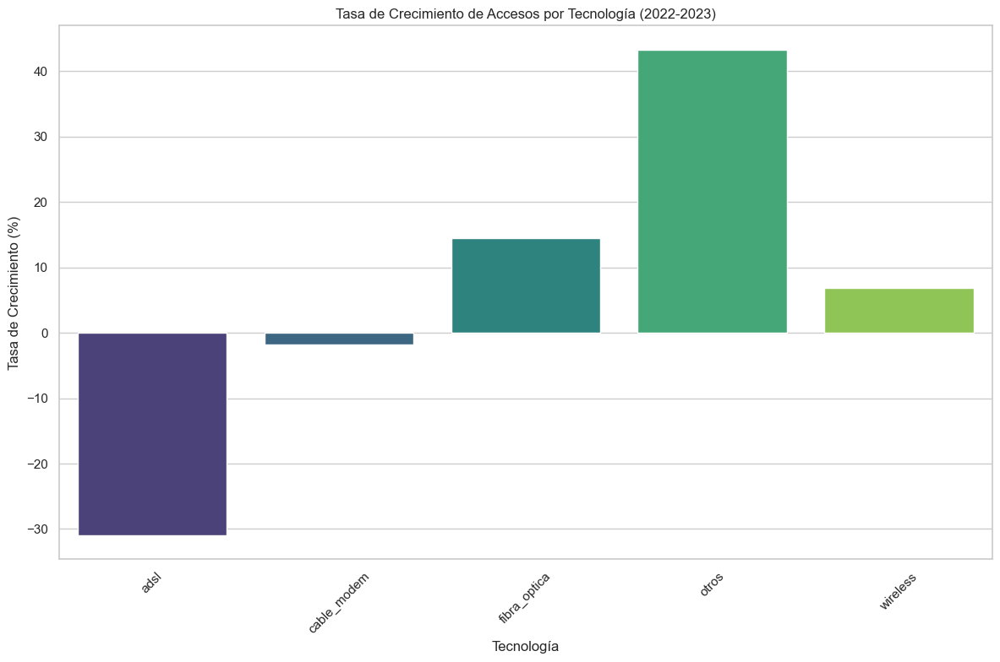

In [59]:
# Convertir el DataFrame a un formato largo
accesos_largo = pd.melt(accesos_por_tecnologia, id_vars=['año', 'trimestre', 'provincia'], 
                        value_vars=['adsl', 'cable_modem', 'fibra_optica', 'wireless', 'otros'],
                        var_name='tecnología', value_name='accesos')

# Agrupar por año y tecnología y sumar los accesos
accesos_tecnologia = accesos_largo.groupby(['año', 'tecnología'])['accesos'].sum().reset_index()

# Pivotar para tener accesos por tecnología y año
accesos_pivot = accesos_tecnologia.pivot_table(index='tecnología', columns='año', values='accesos')

# Convertir los nombres de las columnas a enteros
accesos_pivot.columns = pd.to_numeric(accesos_pivot.columns, errors='coerce')

# Asegúrate de que todos los años están presentes en los datos
accesos_pivot = accesos_pivot.fillna(0)

# Calcular el KPI de crecimiento (2023 respecto a 2022)
if 2022 in accesos_pivot.columns and 2023 in accesos_pivot.columns:
    accesos_pivot['kpi_crecimiento'] = ((accesos_pivot[2023] - accesos_pivot[2022]) / accesos_pivot[2022]) * 100
    
    # Graficar el KPI de crecimiento por tecnología
    plt.figure(figsize=(12, 8))
    sns.barplot(x=accesos_pivot.index, y=accesos_pivot['kpi_crecimiento'], palette='viridis', hue=accesos_pivot.index)
    plt.title('Tasa de Crecimiento de Accesos por Tecnología (2022-2023)')
    plt.xlabel('Tecnología')
    plt.ylabel('Tasa de Crecimiento (%)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
else:
    print("Datos insuficientes para calcular el KPI de crecimiento (falta 2022 o 2023)")

## KPI 2: Velocidad Media de Conexión por Provincia
* Descripción:
    Este KPI mide la velocidad media de conexión a Internet por provincia, proporcionando una visión general de la calidad del servicio en diferentes áreas.

    Fórmula:
    KPI
    velocidad media = Suma de velocidades / Número de registros

In [60]:
velocidad_por_provincia.head()

,año,trimestre,provincia,mbps(media de bajada)
0,2024,1,Buenos Aires,"159,13"
1,2024,1,Capital Federal,"229,94"
2,2024,1,Catamarca,"91,45"
3,2024,1,Chaco,"107,51"
4,2024,1,Chubut,"20,50"


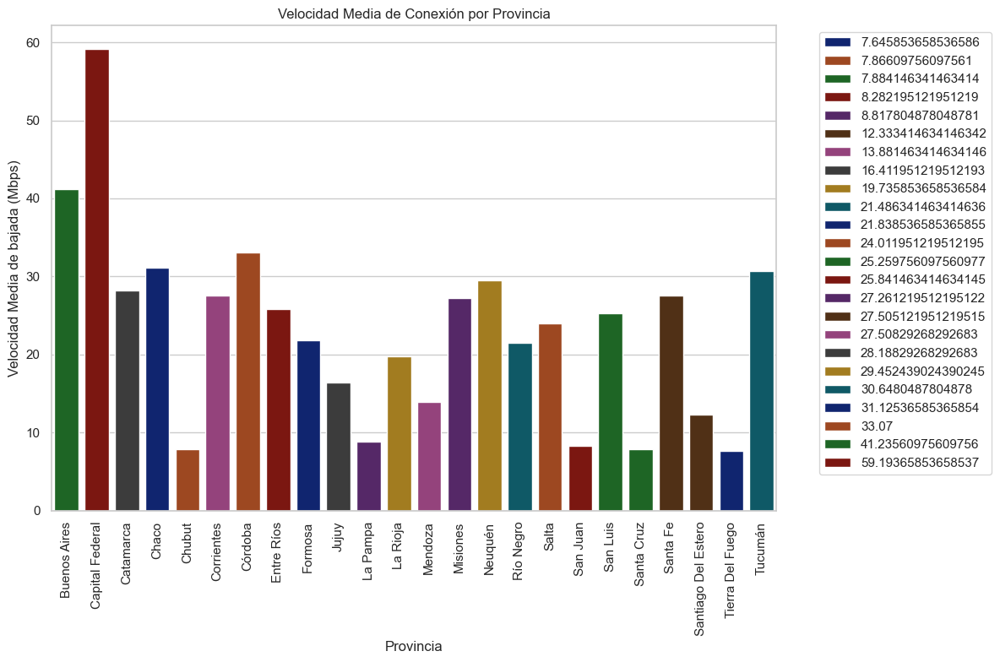

In [61]:
# Si la columna es de tipo cadena, convertir a numérico, manejando comas como separadores decimales
if velocidad_por_provincia['mbps(media de bajada)'].dtype == 'object':
    velocidad_por_provincia['mbps(media de bajada)'] = velocidad_por_provincia['mbps(media de bajada)'].str.replace(',', '.').astype(float)
else:
    velocidad_por_provincia['mbps(media de bajada)'] = pd.to_numeric(velocidad_por_provincia['mbps(media de bajada)'], errors='coerce')

# Agrupar por provincia y calcular la velocidad media
velocidad_media = velocidad_por_provincia.groupby('provincia')['mbps(media de bajada)'].mean()

# Graficar la velocidad media por provincia
plt.figure(figsize=(12, 8))
sns.barplot(x=velocidad_media.index, y=velocidad_media.values, palette='dark', hue=velocidad_media.values)
plt.title('Velocidad Media de Conexión por Provincia')
plt.xlabel('Provincia')
plt.ylabel('Velocidad Media de bajada (Mbps)')
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Mover la leyenda fuera del gráfico
plt.tight_layout()
plt.tight_layout()
plt.show()